In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
path="/content/drive/MyDrive/jellyfish"

In [3]:
import os
labels = os.listdir(path)
labels

['Moon_jellyfish',
 'compass_jellyfish',
 'Train_Test_Valid',
 'barrel_jellyfish',
 'blue_jellyfish',
 'mauve_stinger_jellyfish',
 'lions_mane_jellyfish']

Label: Moon_jellyfish


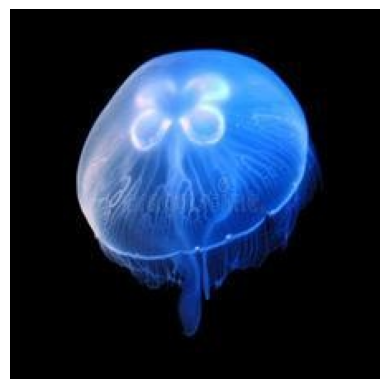

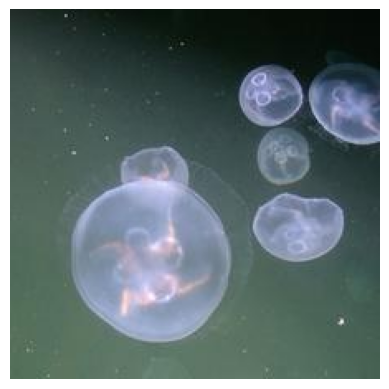

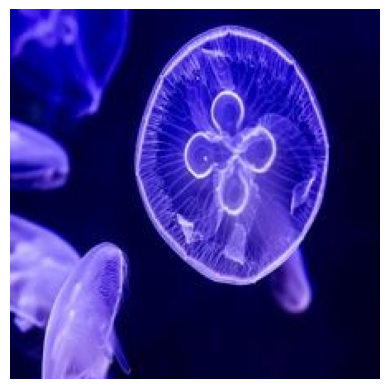

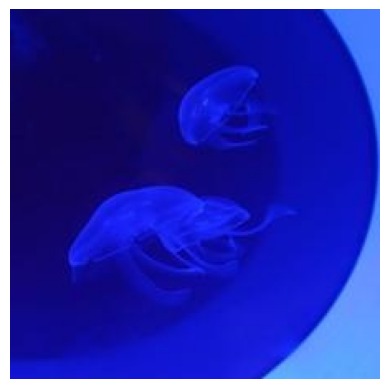

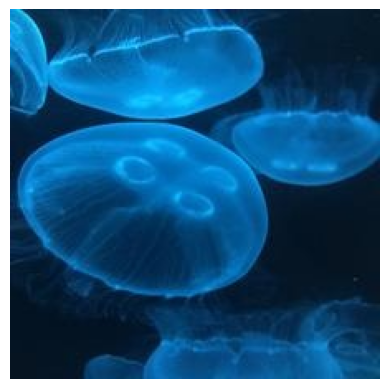

--------------------
Label: compass_jellyfish


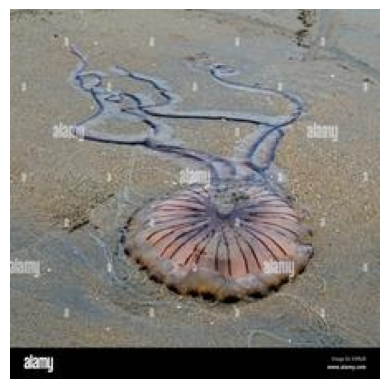

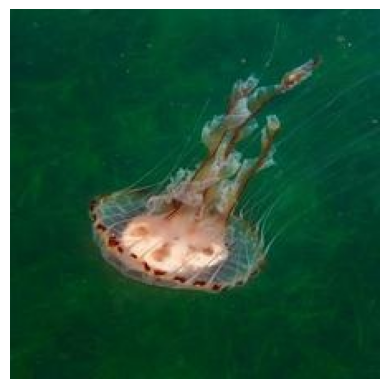

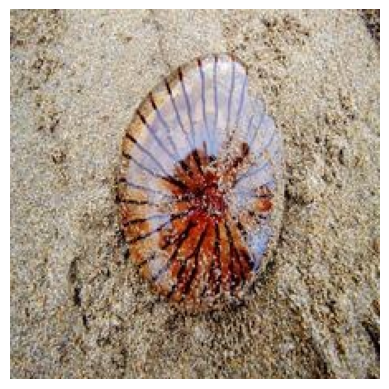

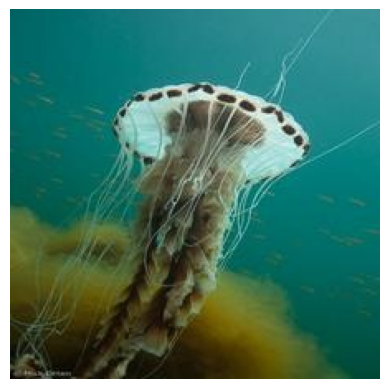

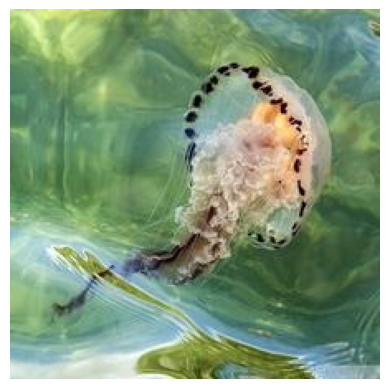

--------------------
Label: Train_Test_Valid
Error loading image /content/drive/MyDrive/jellyfish/Train_Test_Valid/Train: OpenCV(4.11.0) /io/opencv/modules/imgproc/src/color.cpp:199: error: (-215:Assertion failed) !_src.empty() in function 'cvtColor'

Error loading image /content/drive/MyDrive/jellyfish/Train_Test_Valid/valid: OpenCV(4.11.0) /io/opencv/modules/imgproc/src/color.cpp:199: error: (-215:Assertion failed) !_src.empty() in function 'cvtColor'

Error loading image /content/drive/MyDrive/jellyfish/Train_Test_Valid/test: OpenCV(4.11.0) /io/opencv/modules/imgproc/src/color.cpp:199: error: (-215:Assertion failed) !_src.empty() in function 'cvtColor'

--------------------
Label: barrel_jellyfish


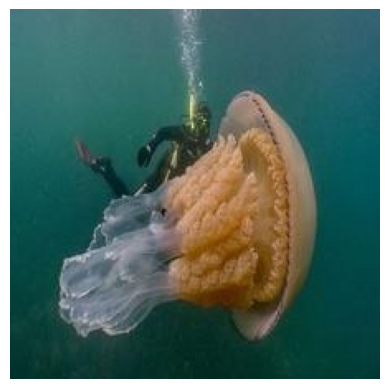

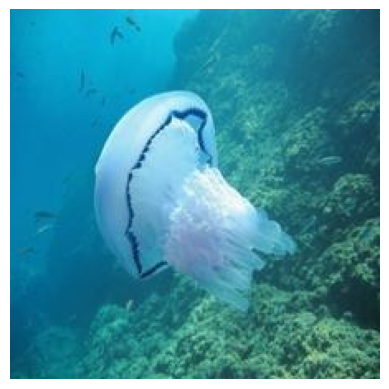

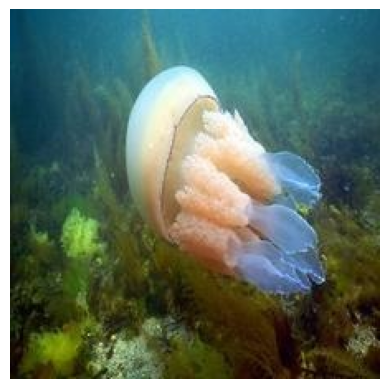

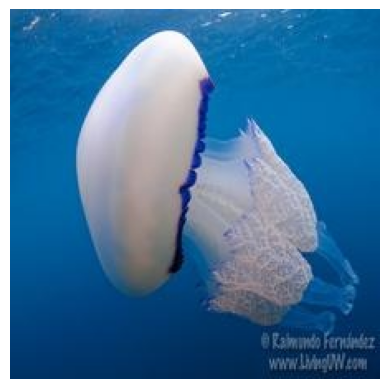

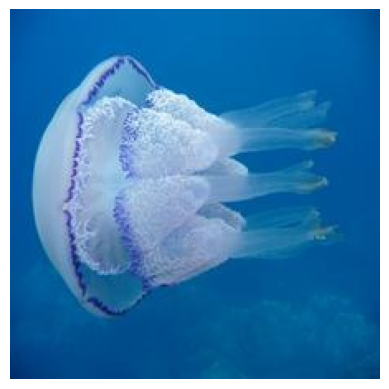

--------------------
Label: blue_jellyfish


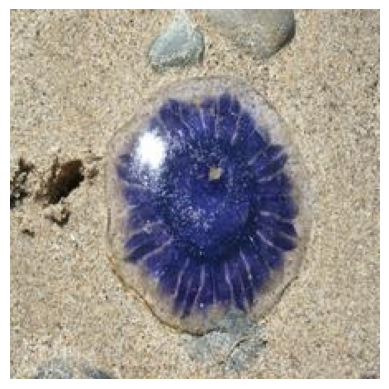

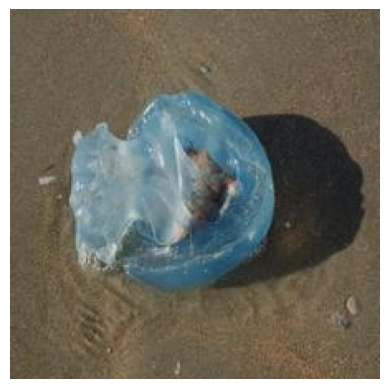

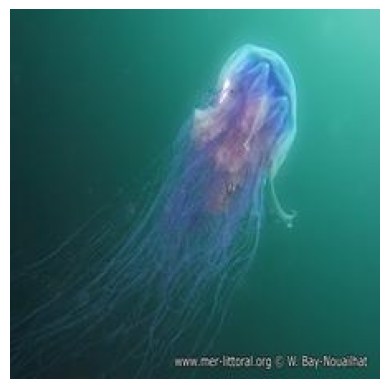

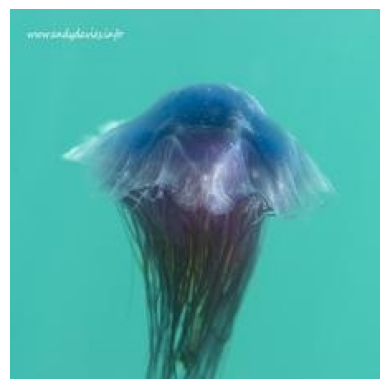

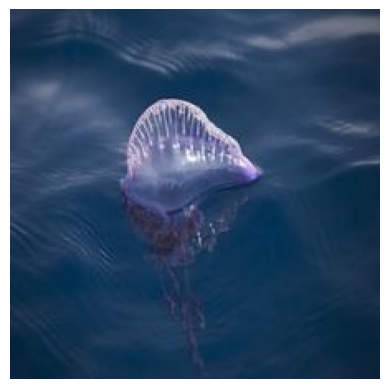

--------------------
Label: mauve_stinger_jellyfish


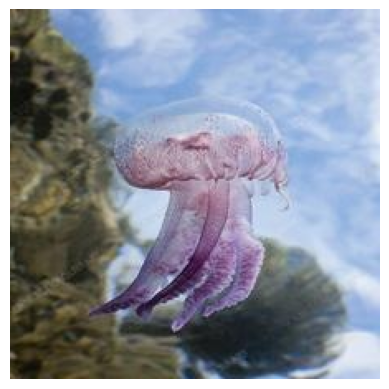

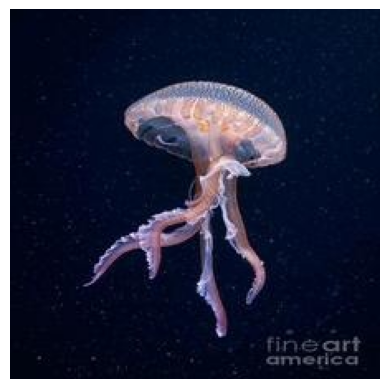

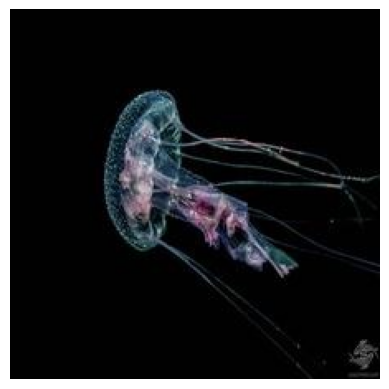

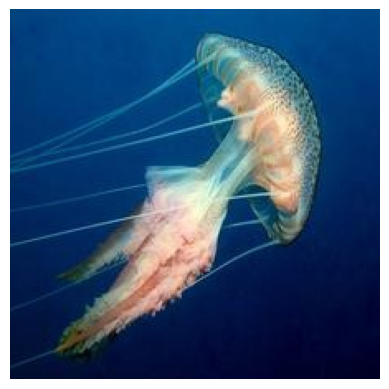

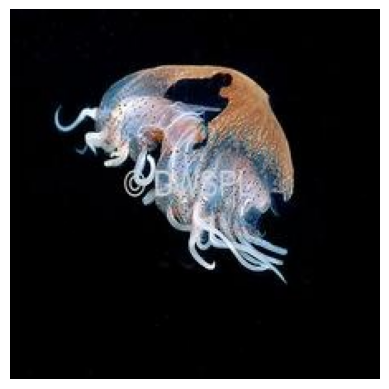

--------------------
Label: lions_mane_jellyfish


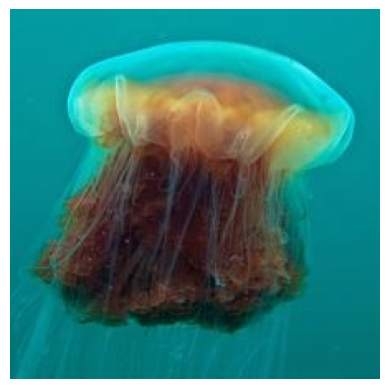

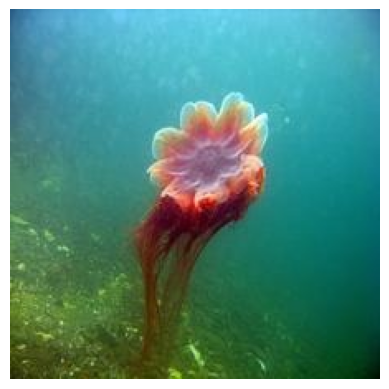

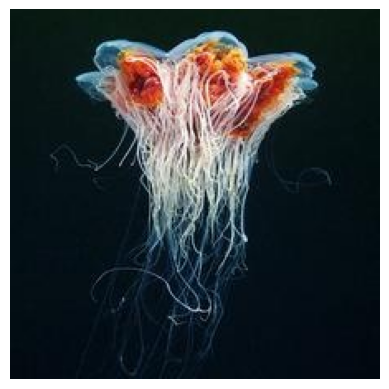

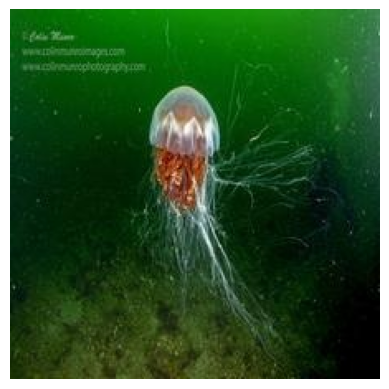

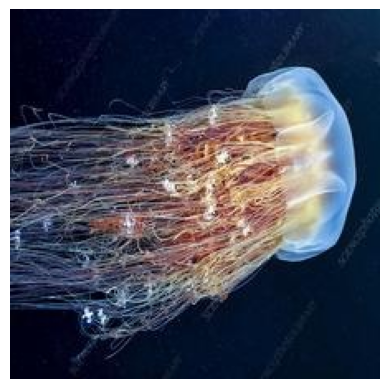

--------------------


In [4]:
import matplotlib.pyplot as plt
import cv2
for label in labels:
  print(f"Label: {label}")
  image_count = 0
  for image_name in os.listdir(os.path.join(path, label)):
      if image_count >=5:
          break
      image_path = os.path.join(path, label, image_name)
      try:
          img = cv2.imread(image_path)
          img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # Convert from BGR to RGB
          plt.imshow(img)
          plt.axis('off')
          plt.show()
          image_count += 1
      except Exception as e:
          print(f"Error loading image {image_path}: {e}")
  print("-" * 20)

Label: Moon_jellyfish


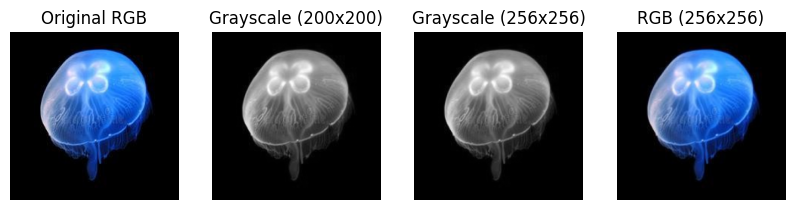

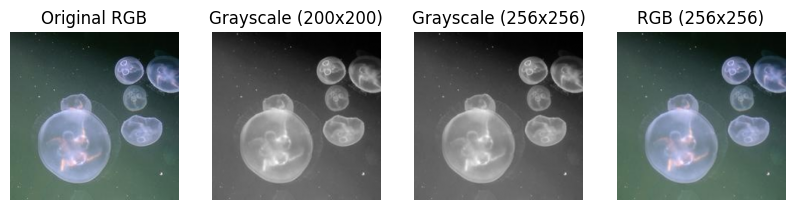

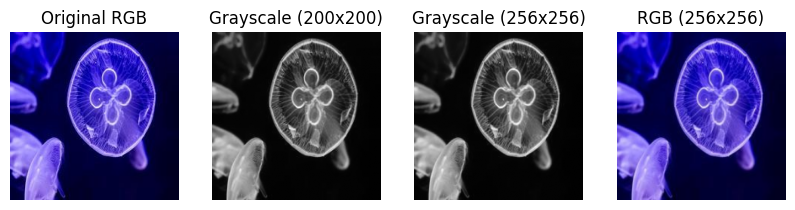

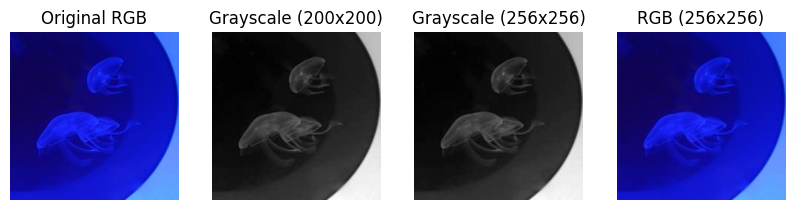

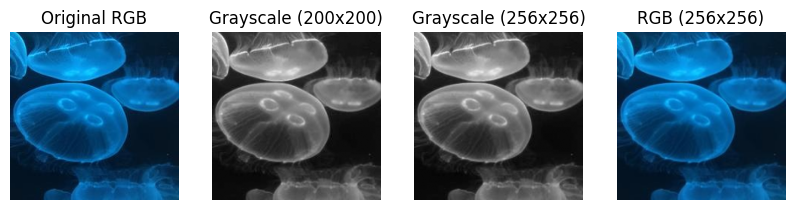

--------------------
Label: compass_jellyfish


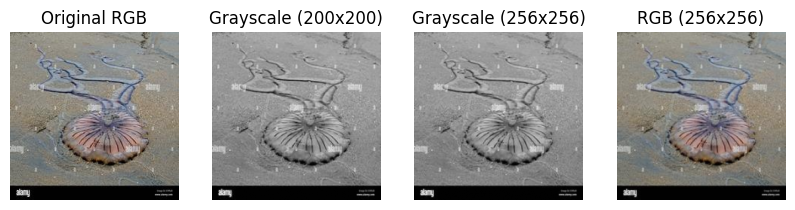

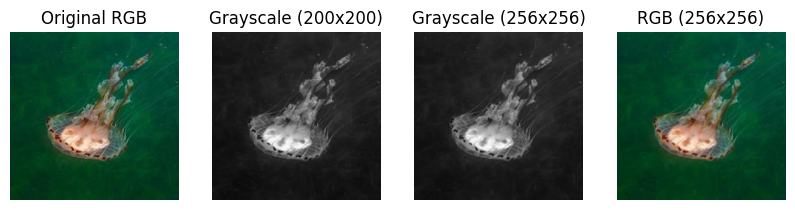

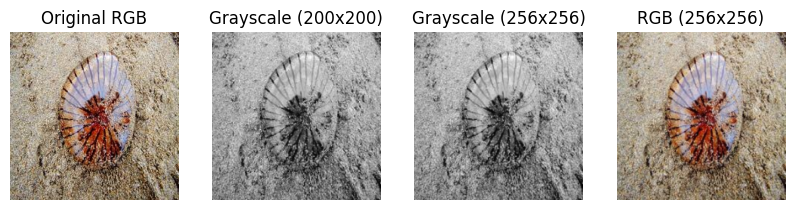

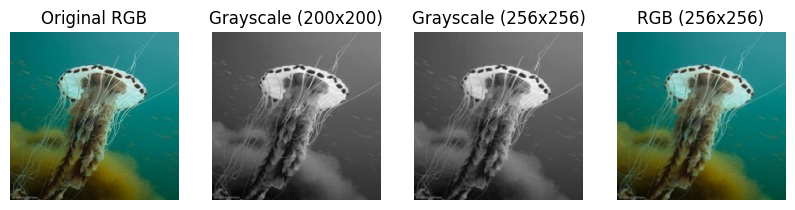

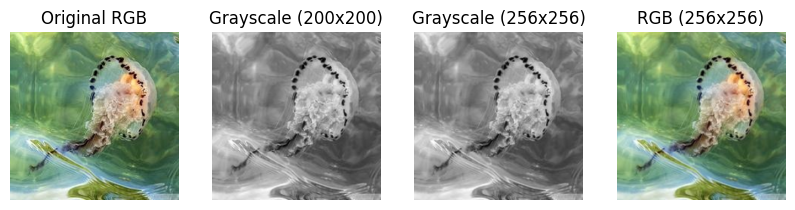

--------------------
Label: Train_Test_Valid
Error loading image /content/drive/MyDrive/jellyfish/Train_Test_Valid/Train: OpenCV(4.11.0) /io/opencv/modules/imgproc/src/color.cpp:199: error: (-215:Assertion failed) !_src.empty() in function 'cvtColor'

Error loading image /content/drive/MyDrive/jellyfish/Train_Test_Valid/valid: OpenCV(4.11.0) /io/opencv/modules/imgproc/src/color.cpp:199: error: (-215:Assertion failed) !_src.empty() in function 'cvtColor'

Error loading image /content/drive/MyDrive/jellyfish/Train_Test_Valid/test: OpenCV(4.11.0) /io/opencv/modules/imgproc/src/color.cpp:199: error: (-215:Assertion failed) !_src.empty() in function 'cvtColor'

--------------------
Label: barrel_jellyfish


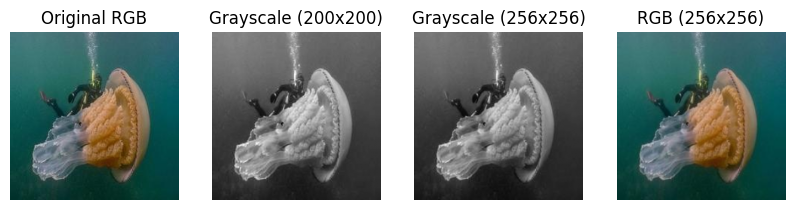

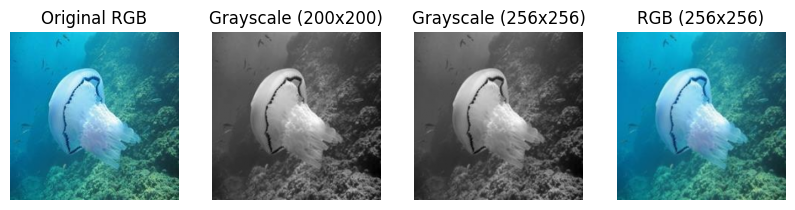

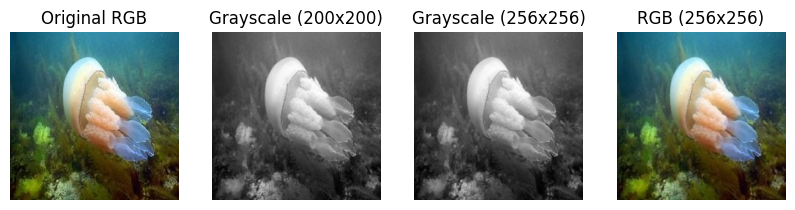

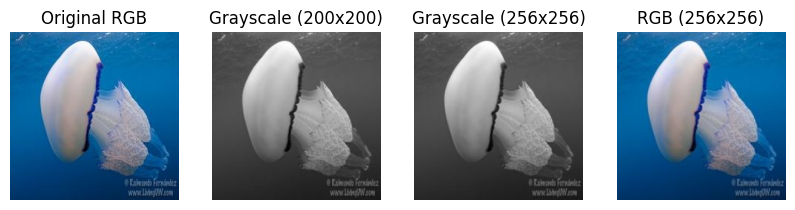

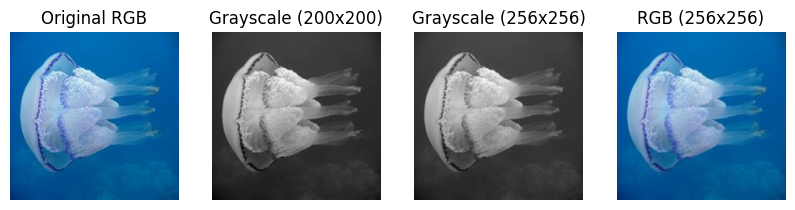

--------------------
Label: blue_jellyfish


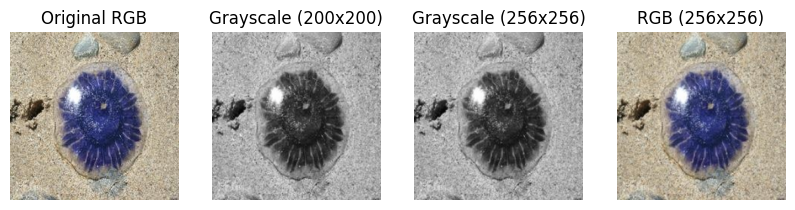

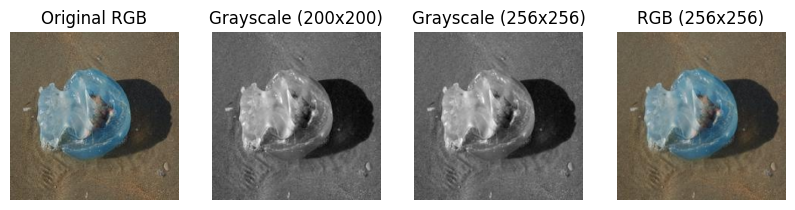

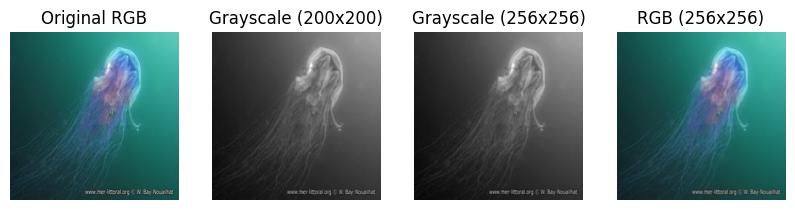

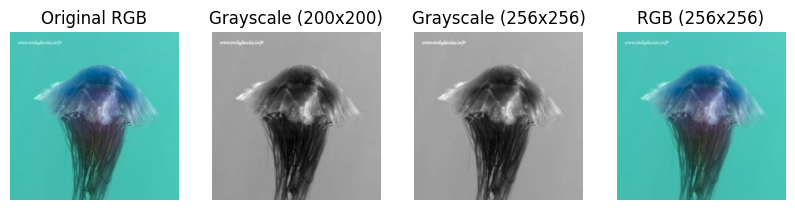

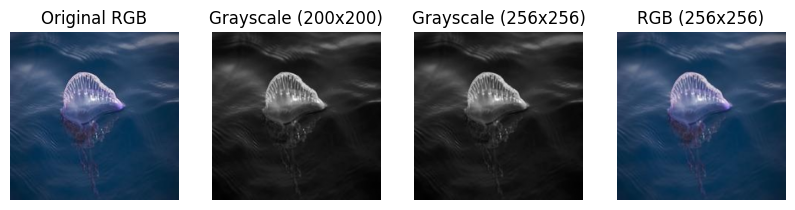

--------------------
Label: mauve_stinger_jellyfish


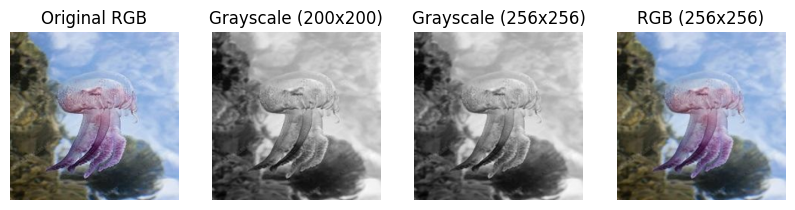

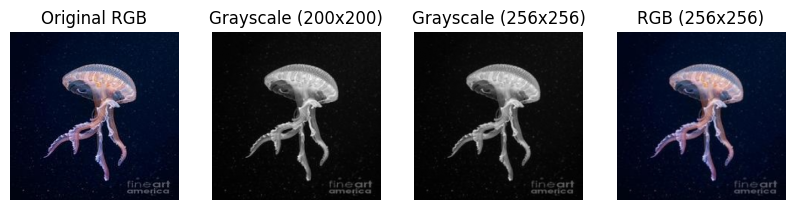

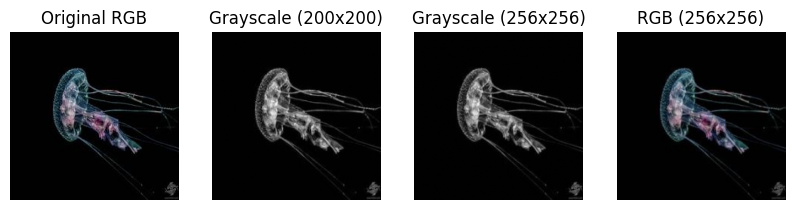

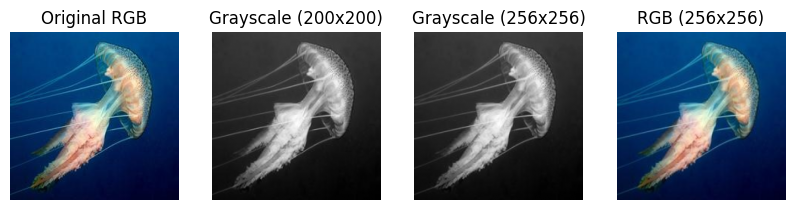

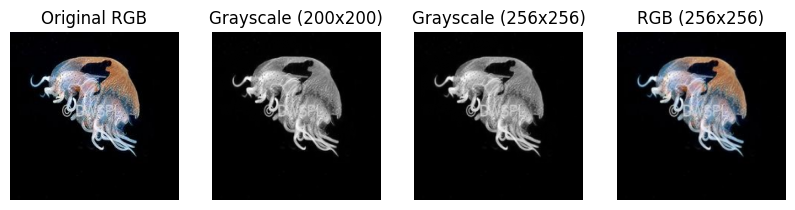

--------------------
Label: lions_mane_jellyfish


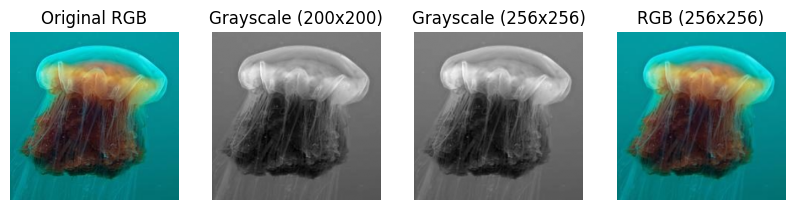

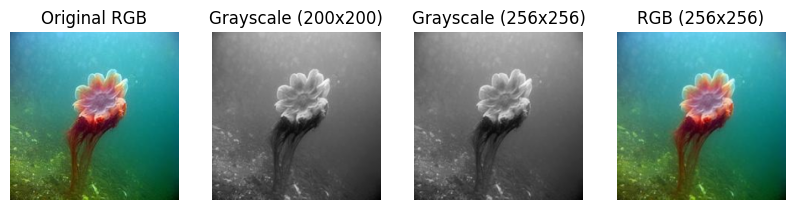

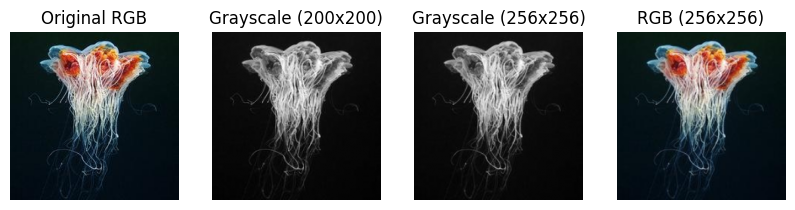

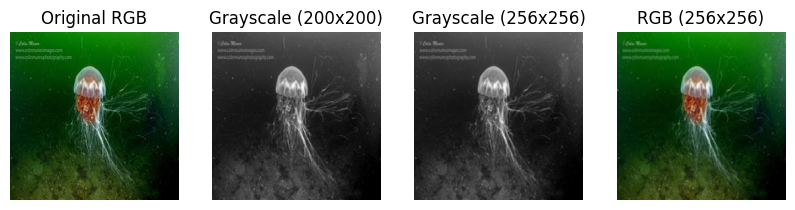

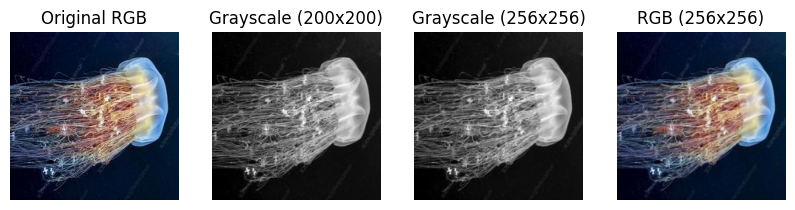

--------------------


In [5]:
import cv2
import matplotlib.pyplot as plt
import numpy as np


for label in labels:
  print(f"Label: {label}")
  image_count = 0
  for image_name in os.listdir(os.path.join(path, label)):
      if image_count >= 5:
          break
      image_path = os.path.join(path, label, image_name)
      try:
          img = cv2.imread(image_path)
          img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

          # Grayscale conversion
          gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

          # Resize images
          gray_img_200 = cv2.resize(gray_img, (200, 200))
          gray_img_256 = cv2.resize(gray_img, (256, 256))
          img_200 = cv2.resize(img, (200, 200))
          img_256 = cv2.resize(img, (256,256))

          # Display images
          plt.figure(figsize=(10, 5))

          plt.subplot(1, 4, 1)
          plt.imshow(img)
          plt.title('Original RGB')
          plt.axis('off')

          plt.subplot(1, 4, 2)
          plt.imshow(gray_img_200, cmap='gray')
          plt.title('Grayscale (200x200)')
          plt.axis('off')

          plt.subplot(1, 4, 3)
          plt.imshow(gray_img_256, cmap='gray')
          plt.title('Grayscale (256x256)')
          plt.axis('off')

          plt.subplot(1,4,4)
          plt.imshow(img_256)
          plt.title('RGB (256x256)')
          plt.axis('off')

          plt.show()

          image_count += 1
      except Exception as e:
          print(f"Error loading image {image_path}: {e}")
  print("-" * 20)


In [6]:
import os
import random
from shutil import copyfile

def split_dataset(source_dir, train_dir, val_dir, test_dir, train_ratio=0.7, val_ratio=0.15, test_ratio=0.15):
    """Splits a dataset into train, validation, and test sets."""

    if train_ratio + val_ratio + test_ratio != 1.0:
        raise ValueError("Ratios must sum to 1.0")

    for label in os.listdir(source_dir):
        label_source = os.path.join(source_dir, label)
        label_train = os.path.join(train_dir, label)
        label_val = os.path.join(val_dir, label)
        label_test = os.path.join(test_dir, label)

        os.makedirs(label_train, exist_ok=True)
        os.makedirs(label_val, exist_ok=True)
        os.makedirs(label_test, exist_ok=True)

        images = [f for f in os.listdir(label_source) if os.path.isfile(os.path.join(label_source, f))]
        random.shuffle(images)
        num_images = len(images)

        num_train = int(num_images * train_ratio)
        num_val = int(num_images * val_ratio)
        num_test = num_images - num_train - num_val  # Ensure all images are used

        for i, image in enumerate(images):
            source_path = os.path.join(label_source, image)
            if i < num_train:
                destination_path = os.path.join(label_train, image)
            elif i < num_train + num_val:
                destination_path = os.path.join(label_val, image)
            else:
                destination_path = os.path.join(label_test, image)
            copyfile(source_path, destination_path)

# Example usage (replace with your actual paths)
source_directory = "/content/drive/MyDrive/jellyfish"
train_directory = "/content/drive/MyDrive/jellyfish/Train_Test_Valid/Train"
val_directory = "/content/drive/MyDrive/jellyfish/Train_Test_Valid/valid"
test_directory = "/content/drive/MyDrive/jellyfish/Train_Test_Valid/test"

split_dataset(source_directory, train_directory, val_directory, test_directory)


In [7]:

from tensorflow.keras.preprocessing.image import ImageDataGenerator

datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

train_generator = datagen.flow_from_directory(
    '/content/drive/MyDrive/jellyfish/Train_Test_Valid/Train',
    target_size=(256, 256),
    batch_size=32,
    class_mode='categorical'
)


validation_generator = datagen.flow_from_directory(
    '/content/drive/MyDrive/jellyfish/Train_Test_Valid/valid',
    target_size=(256, 256),
    batch_size=32,
    class_mode='categorical'
)

test_generator = datagen.flow_from_directory(
    '/content/drive/MyDrive/jellyfish/Train_Test_Valid/test',
    target_size=(256, 256),
    batch_size=32,
    class_mode='categorical',
    shuffle=False
)


Found 900 images belonging to 7 classes.
Found 171 images belonging to 7 classes.
Found 178 images belonging to 7 classes.


In [11]:
from tensorflow import keras
from tensorflow.keras import layers

# Define the CNN model
model = keras.Sequential(
    [
        keras.Input(shape=(256, 256, 3)),  # Input shape
        layers.Conv2D(32, kernel_size=(3, 3), activation="relu"),
        layers.MaxPooling2D(pool_size=(2, 2)),
        layers.Conv2D(64, kernel_size=(3, 3), activation="relu"),
        layers.MaxPooling2D(pool_size=(2, 2)),
        layers.Flatten(),
        layers.Dropout(0.5),  # Dropout for regularization
        layers.Dense(7, activation="softmax"),  # Output layer (Changed to 7 classes)
    ]
)

In [12]:
# Compile the model
model.compile(loss="categorical_crossentropy", optimizer="adam", metrics=["accuracy"])


In [13]:
# Train the model
history = model.fit(train_generator, epochs=10, validation_data=validation_generator)

Epoch 1/10
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.2447 - loss: 2.1117

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


29/29 ━━━━━━━━━━━━━━━━━━━━ 103s 3s/step - accuracy: 0.2456 - loss: 2.1022 - val_accuracy: 0.3684 - val_loss: 1.5313
Epoch 2/10
29/29 ━━━━━━━━━━━━━━━━━━━━ 23s 800ms/step - accuracy: 0.3618 - loss: 1.5136 - val_accuracy: 0.4678 - val_loss: 1.2952
Epoch 3/10
29/29 ━━━━━━━━━━━━━━━━━━━━ 22s 760ms/step - accuracy: 0.4391 - loss: 1.3655 - val_accuracy: 0.4620 - val_loss: 1.3055
Epoch 4/10
29/29 ━━━━━━━━━━━━━━━━━━━━ 23s 794ms/step - accuracy: 0.4769 - loss: 1.2929 - val_accuracy: 0.5263 - val_loss: 1.1574
Epoch 5/10
29/29 ━━━━━━━━━━━━━━━━━━━━ 21s 736ms/step - accuracy: 0.5098 - loss: 1.2174 - val_accuracy: 0.5614 - val_loss: 1.1831
Epoch 6/10
29/29 ━━━━━━━━━━━━━━━━━━━━ 23s 801ms/step - accuracy: 0.5571 - loss: 1.1283 - val_accuracy: 0.5556 - val_loss: 1.1741
Epoch 7/10
29/29 ━━━━━━━━━━━━━━━━━━━━ 23s 800ms/step - accuracy: 0.5520 - loss: 1.1335 - val_accuracy: 0.5731 - val_loss: 1.1270
Epoch 8/10
29/29 ━━━━━━━━━━━━━━━━━━━━ 22s 742ms/step - accuracy: 0.5991 - loss: 1.0600 - val_accuracy: 0.6433 

In [14]:
# Evaluate the model on the test set
loss, accuracy = model.evaluate(test_generator)
print(f"Test Loss: {loss:.4f}")
print(f"Test Accuracy: {accuracy:.4f}")

6/6 ━━━━━━━━━━━━━━━━━━━━ 14s 3s/step - accuracy: 0.6601 - loss: 0.9360
Test Loss: 0.9353
Test Accuracy: 0.6404


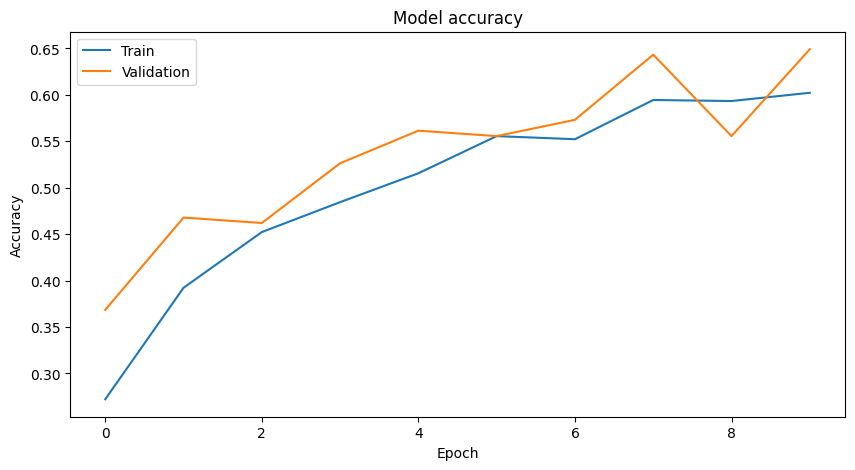

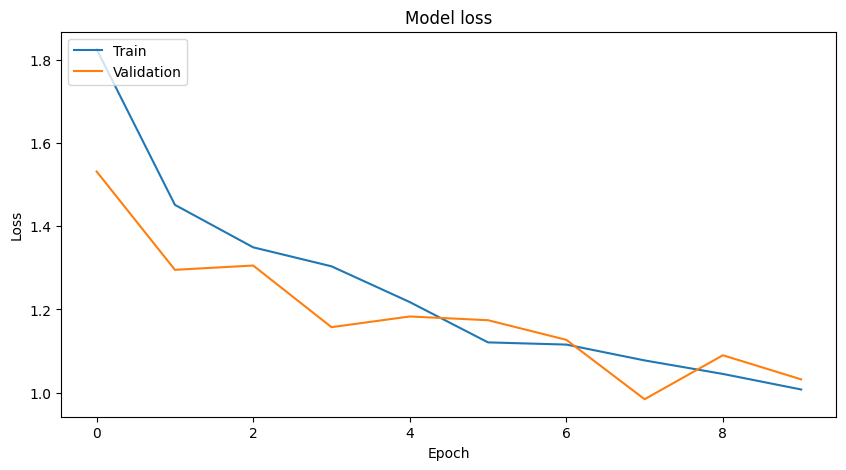

In [15]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

plt.figure(figsize=(10, 5))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()


In [16]:
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_2 (Conv2D)               │ (None, 254, 254, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 127, 127, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 125, 125, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 62, 62, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 246016)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 246016)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 7)              │     1,722,119 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 5,224,535 (19.93 MB)

 Trainable params: 1,741,511 (6.64 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,483,024 (13.29 MB)

In [18]:
from sklearn.metrics import classification_report

y_pred = model.predict(test_generator)
y_pred_classes = np.argmax(y_pred, axis=1)

y_true = test_generator.classes

# Get the unique class labels from y_true
unique_labels = np.unique(y_true)

# Get the target names for the unique labels
target_names = [list(test_generator.class_indices.keys())[label] for label in unique_labels]

# Generate the classification report using the unique labels and target names
print(classification_report(y_true, y_pred_classes, labels=unique_labels, target_names=target_names))

6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 528ms/step
                         precision    recall  f1-score   support

         Moon_jellyfish       0.88      0.52      0.65        29
       barrel_jellyfish       0.59      0.71      0.65        28
         blue_jellyfish       0.51      0.77      0.61        30
      compass_jellyfish       0.47      0.60      0.53        30
   lions_mane_jellyfish       0.75      0.68      0.71        31
mauve_stinger_jellyfish       0.94      0.50      0.65        30

               accuracy                           0.63       178
              macro avg       0.69      0.63      0.63       178
           weighted avg       0.69      0.63      0.63       178



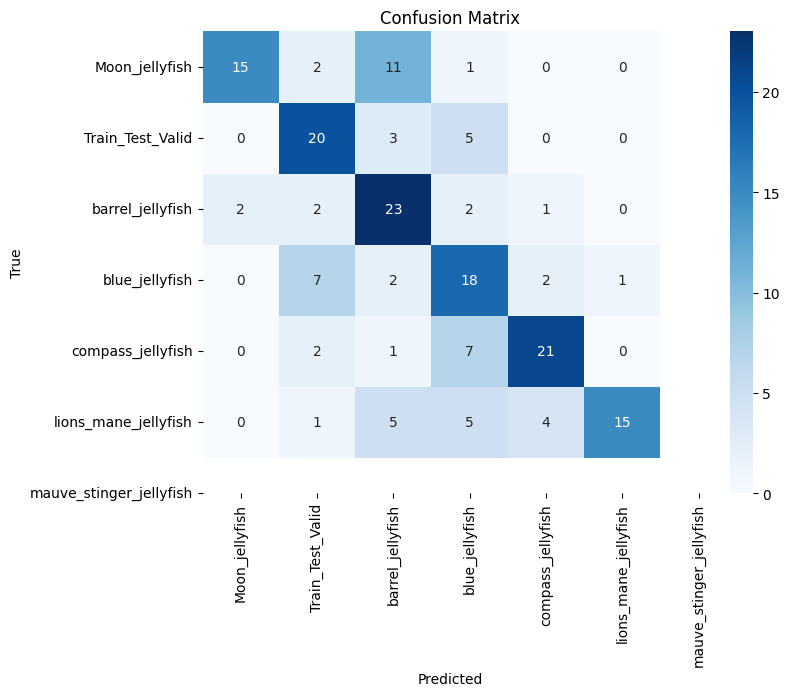

In [19]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix
import seaborn as sns

cm = confusion_matrix(y_true, y_pred_classes)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=list(test_generator.class_indices.keys()),
            yticklabels=list(test_generator.class_indices.keys()))
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()


Saving 02.jpg to 02.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 559ms/step
Predicted rice type for 02.jpg: barrel_jellyfish


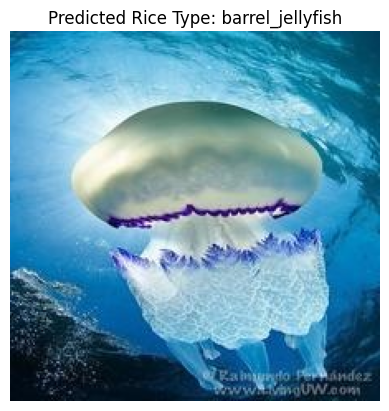

In [20]:
from google.colab import files
import matplotlib.pyplot as plt
import cv2
import numpy as np

def predict_rice_type(image_path):
    try:
        img = cv2.imread(image_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, (256, 256))
        img = img / 255.0
        img = np.expand_dims(img, axis=0)

        prediction = model.predict(img)
        predicted_class_index = np.argmax(prediction)

        class_labels = list(test_generator.class_indices.keys())

        predicted_label = class_labels[predicted_class_index]
        return predicted_label
    except Exception as e:
        print(f"Error predicting rice type: {e}")
        return None


uploaded = files.upload()
for fn in uploaded.keys():
    image_path = fn
    predicted_rice_type = predict_rice_type(image_path)

    if predicted_rice_type:
        print(f"Predicted rice type for {image_path}: {predicted_rice_type}")

        img = cv2.imread(image_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.imshow(img)
        plt.title(f'Predicted Rice Type: {predicted_rice_type}')
        plt.axis('off')
        plt.show()
    else:
        print(f"Could not predict rice type for {image_path}")

Saving 03.jpg to 03.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
Predicted rice type for 03.jpg: blue_jellyfish


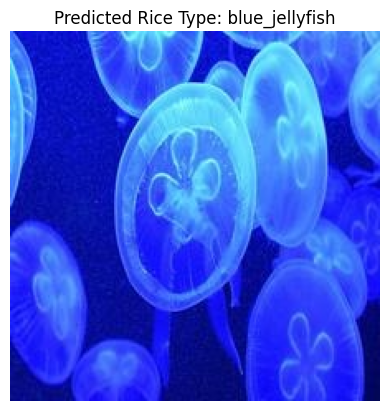

In [21]:
from google.colab import files
import matplotlib.pyplot as plt
import cv2
import numpy as np

def predict_rice_type(image_path):
    try:
        img = cv2.imread(image_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, (256, 256))
        img = img / 255.0
        img = np.expand_dims(img, axis=0)

        prediction = model.predict(img)
        predicted_class_index = np.argmax(prediction)

        class_labels = list(test_generator.class_indices.keys())

        predicted_label = class_labels[predicted_class_index]
        return predicted_label
    except Exception as e:
        print(f"Error predicting rice type: {e}")
        return None


uploaded = files.upload()
for fn in uploaded.keys():
    image_path = fn
    predicted_rice_type = predict_rice_type(image_path)

    if predicted_rice_type:
        print(f"Predicted rice type for {image_path}: {predicted_rice_type}")

        img = cv2.imread(image_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.imshow(img)
        plt.title(f'Predicted Rice Type: {predicted_rice_type}')
        plt.axis('off')
        plt.show()
    else:
        print(f"Could not predict rice type for {image_path}")

Saving 02.jpg to 02 (1).jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
Predicted rice type for 02 (1).jpg: compass_jellyfish


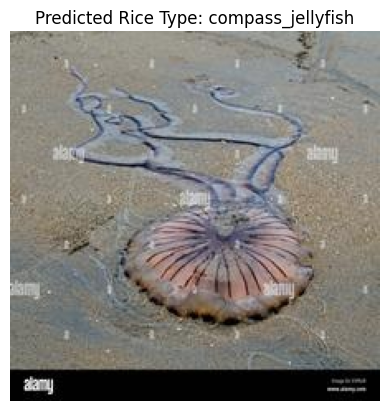

In [22]:
from google.colab import files
import matplotlib.pyplot as plt
import cv2
import numpy as np

def predict_rice_type(image_path):
    try:
        img = cv2.imread(image_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, (256, 256))
        img = img / 255.0
        img = np.expand_dims(img, axis=0)

        prediction = model.predict(img)
        predicted_class_index = np.argmax(prediction)

        class_labels = list(test_generator.class_indices.keys())

        predicted_label = class_labels[predicted_class_index]
        return predicted_label
    except Exception as e:
        print(f"Error predicting rice type: {e}")
        return None


uploaded = files.upload()
for fn in uploaded.keys():
    image_path = fn
    predicted_rice_type = predict_rice_type(image_path)

    if predicted_rice_type:
        print(f"Predicted rice type for {image_path}: {predicted_rice_type}")

        img = cv2.imread(image_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.imshow(img)
        plt.title(f'Predicted Rice Type: {predicted_rice_type}')
        plt.axis('off')
        plt.show()
    else:
        print(f"Could not predict rice type for {image_path}")

Saving 03.jpg to 03 (1).jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
Predicted rice type for 03 (1).jpg: lions_mane_jellyfish


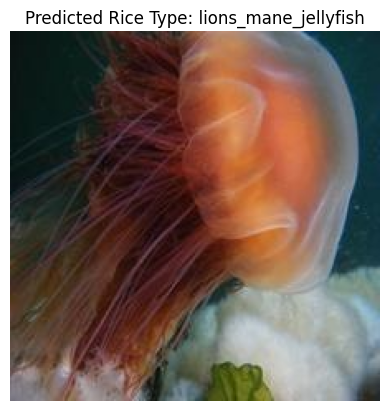

In [23]:
from google.colab import files
import matplotlib.pyplot as plt
import cv2
import numpy as np

def predict_rice_type(image_path):
    try:
        img = cv2.imread(image_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, (256, 256))
        img = img / 255.0
        img = np.expand_dims(img, axis=0)

        prediction = model.predict(img)
        predicted_class_index = np.argmax(prediction)

        class_labels = list(test_generator.class_indices.keys())

        predicted_label = class_labels[predicted_class_index]
        return predicted_label
    except Exception as e:
        print(f"Error predicting rice type: {e}")
        return None


uploaded = files.upload()
for fn in uploaded.keys():
    image_path = fn
    predicted_rice_type = predict_rice_type(image_path)

    if predicted_rice_type:
        print(f"Predicted rice type for {image_path}: {predicted_rice_type}")

        img = cv2.imread(image_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.imshow(img)
        plt.title(f'Predicted Rice Type: {predicted_rice_type}')
        plt.axis('off')
        plt.show()
    else:
        print(f"Could not predict rice type for {image_path}")

Saving 02.jpg to 02 (2).jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
Predicted rice type for 02 (2).jpg: barrel_jellyfish


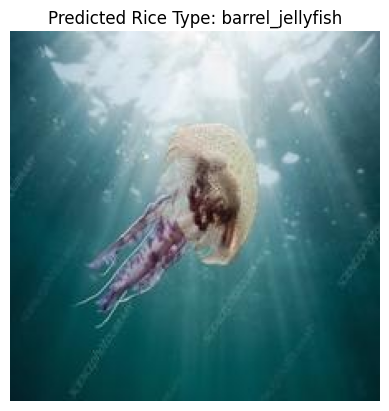

In [24]:
from google.colab import files
import matplotlib.pyplot as plt
import cv2
import numpy as np

def predict_rice_type(image_path):
    try:
        img = cv2.imread(image_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, (256, 256))
        img = img / 255.0
        img = np.expand_dims(img, axis=0)

        prediction = model.predict(img)
        predicted_class_index = np.argmax(prediction)

        class_labels = list(test_generator.class_indices.keys())

        predicted_label = class_labels[predicted_class_index]
        return predicted_label
    except Exception as e:
        print(f"Error predicting rice type: {e}")
        return None


uploaded = files.upload()
for fn in uploaded.keys():
    image_path = fn
    predicted_rice_type = predict_rice_type(image_path)

    if predicted_rice_type:
        print(f"Predicted rice type for {image_path}: {predicted_rice_type}")

        img = cv2.imread(image_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.imshow(img)
        plt.title(f'Predicted Rice Type: {predicted_rice_type}')
        plt.axis('off')
        plt.show()
    else:
        print(f"Could not predict rice type for {image_path}")

Saving 02.jpg to 02 (3).jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
Predicted rice type for 02 (3).jpg: Moon_jellyfish


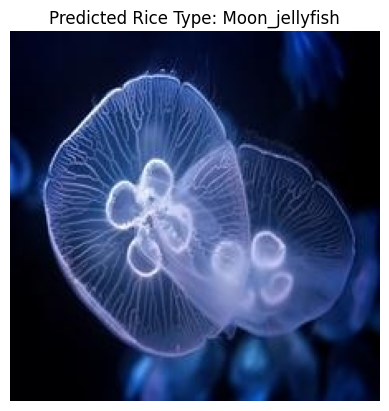

In [25]:
from google.colab import files
import matplotlib.pyplot as plt
import cv2
import numpy as np

def predict_rice_type(image_path):
    try:
        img = cv2.imread(image_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, (256, 256))
        img = img / 255.0
        img = np.expand_dims(img, axis=0)

        prediction = model.predict(img)
        predicted_class_index = np.argmax(prediction)

        class_labels = list(test_generator.class_indices.keys())

        predicted_label = class_labels[predicted_class_index]
        return predicted_label
    except Exception as e:
        print(f"Error predicting rice type: {e}")
        return None


uploaded = files.upload()
for fn in uploaded.keys():
    image_path = fn
    predicted_rice_type = predict_rice_type(image_path)

    if predicted_rice_type:
        print(f"Predicted rice type for {image_path}: {predicted_rice_type}")

        img = cv2.imread(image_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.imshow(img)
        plt.title(f'Predicted Rice Type: {predicted_rice_type}')
        plt.axis('off')
        plt.show()
    else:
        print(f"Could not predict rice type for {image_path}")

In [29]:
from statsmodels.stats.weightstats import ztest

sample_accuracies = [0.82, 0.79, 0.85, 0.81, 0.83]
value = 0.8

z_statistic, p_value = ztest(sample_accuracies, value=value)

print(f"Z-statistic: {z_statistic}")
print(f"P-value: {p_value}")

alpha = 0.05
if p_value < alpha:
    print("Reject the null hypothesis: The average accuracy is significantly different from 0.8.")
else:
    print("Fail to reject the null hypothesis: There's no significant difference in average accuracy from 0.8.")


Z-statistic: 1.9999999999999933
P-value: 0.0455002638963591
Reject the null hypothesis: The average accuracy is significantly different from 0.8.


In [30]:
from scipy import stats

sample_accuracies = [0.82, 0.79, 0.85, 0.81, 0.83]
value = 0.8

t_statistic, p_value = stats.ttest_1samp(sample_accuracies, value)

print(f"T-statistic: {t_statistic}")
print(f"P-value: {p_value}")

alpha = 0.05
if p_value < alpha:
    print("Reject the null hypothesis: The average accuracy is significantly different from 0.8.")
else:
    print("Fail to reject the null hypothesis: There's no significant difference in average accuracy from 0.8.")


T-statistic: 1.9999999999999933
P-value: 0.11611652351681642
Fail to reject the null hypothesis: There's no significant difference in average accuracy from 0.8.


In [31]:
observed_frequencies = [10, 15, 20, 25]
expected_frequencies = [14, 17.5, 21, 27.5]


total_observed = sum(observed_frequencies)

expected_frequencies = [(freq / sum(expected_frequencies)) * total_observed for freq in expected_frequencies]

chi2_statistic, p_value = stats.chisquare(observed_frequencies, f_exp=expected_frequencies)

print(f"Chi-square statistic: {chi2_statistic}")
print(f"P-value: {p_value}")

alpha = 0.05
if p_value < alpha:
  print("Reject the null hypothesis: There's a significant difference between observed and expected frequencies.")
else:
  print("Fail to reject the null hypothesis: No significant difference between observed and expected frequencies.")

Chi-square statistic: 0.5998763141620285
P-value: 0.8964606878074289
Fail to reject the null hypothesis: No significant difference between observed and expected frequencies.


In [32]:
from statsmodels.stats.weightstats import ztest

group1 = [85, 90, 92, 88, 95]
group2 = [80, 82, 85, 78, 83]

z_statistic, p_value = ztest(group1, group2)

print(f"Z-statistic: {z_statistic}")
print(f"P-value: {p_value}")

alpha = 0.05
if p_value < alpha:
    print("Reject the null hypothesis: There is a statistically significant difference between the groups.")
else:
    print("Fail to reject the null hypothesis: There is no statistically significant difference between the groups.")


Z-statistic: 4.022870397928839
P-value: 5.749313666325864e-05
Reject the null hypothesis: There is a statistically significant difference between the groups.
